# PID joint control 

In [1]:
import gym,mujoco_py,warnings,time
gym.logger.set_level(40)
warnings.filterwarnings("ignore") 
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from util import PID_class,display_frames_as_gif
from custom_ant import AntEnvCustom
np.set_printoptions(precision=2,linewidth=150)
print ("Packages loaded")

Packages loaded


### Control

Ant custom env -SJ
Environment initialized. obs_dim:[111] act_dim:[8] dt:[0.050sec]
PID ready
Creating window glfw
Makeing GIF..



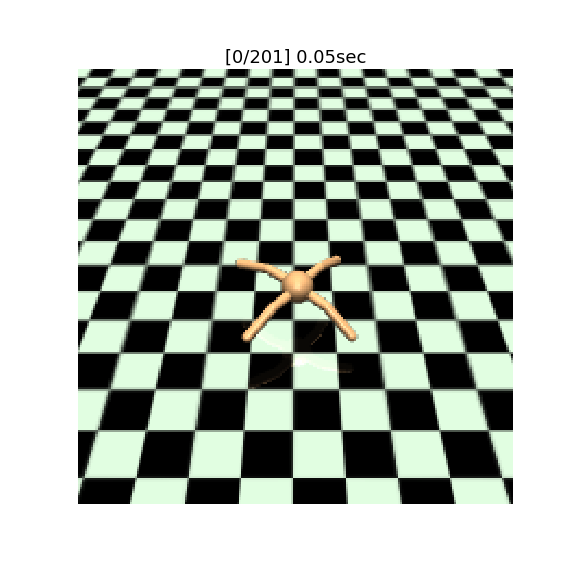
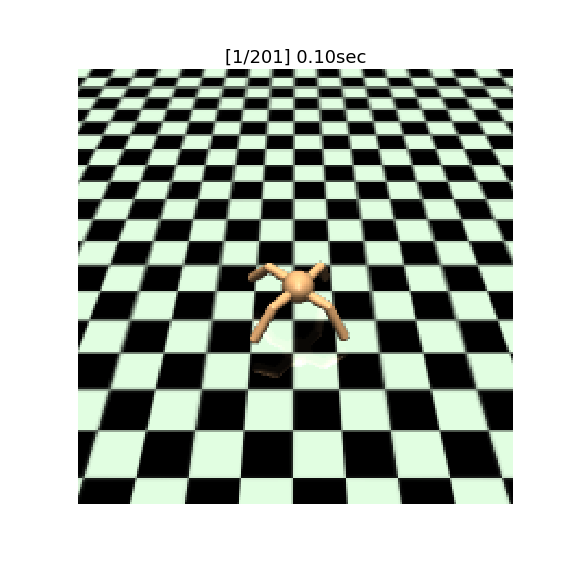
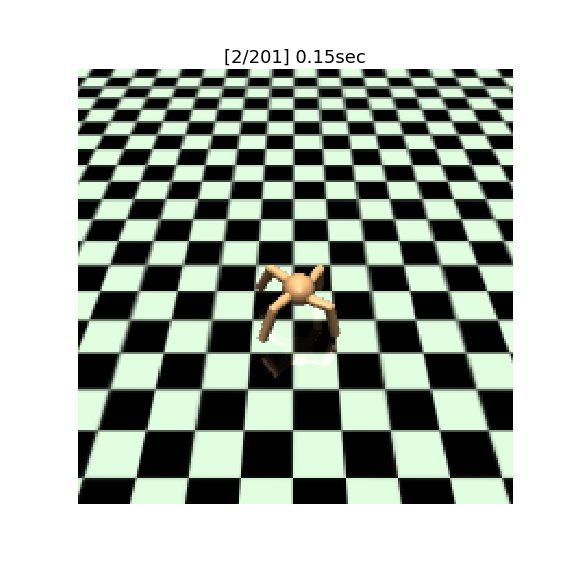
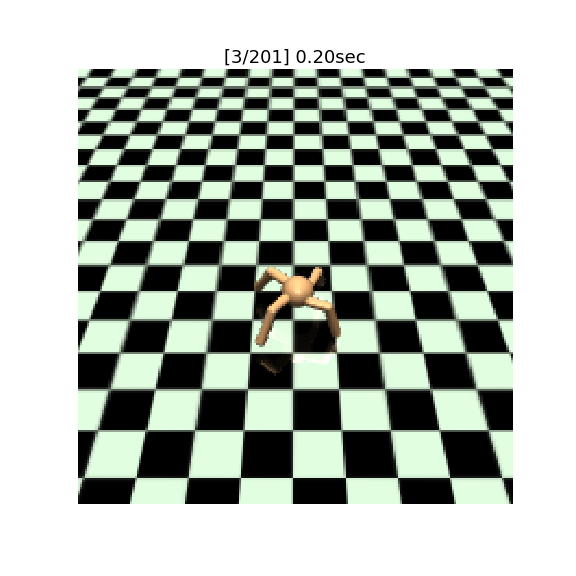
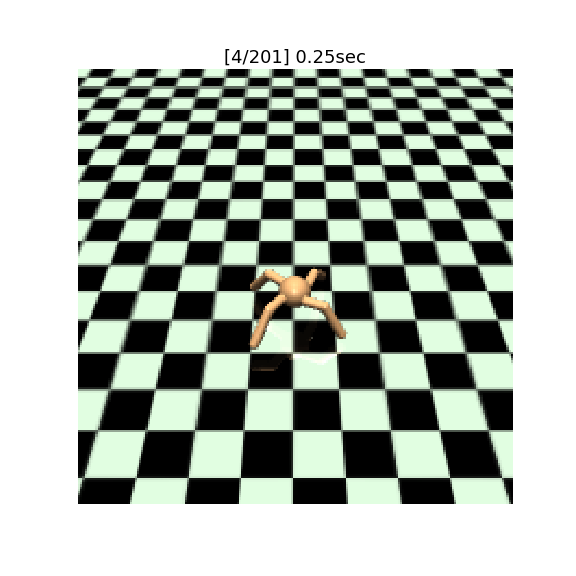
...
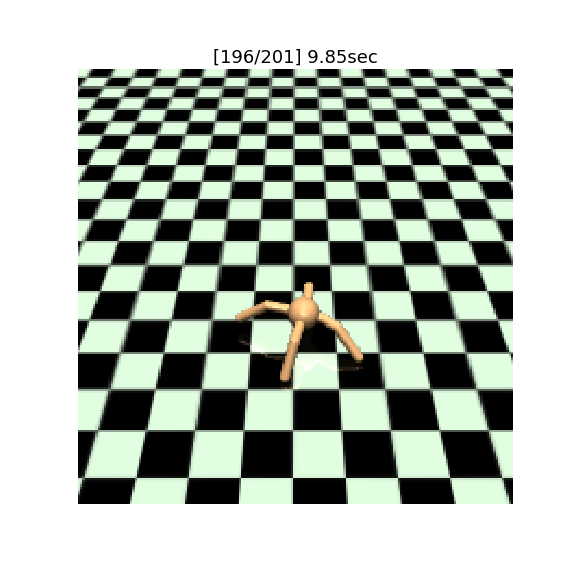
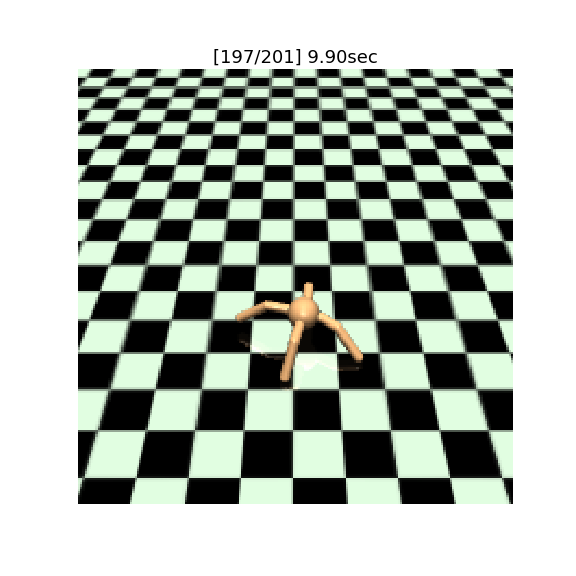
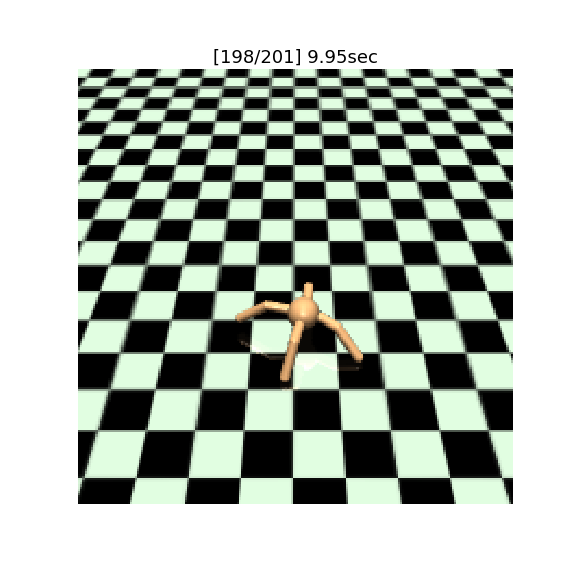
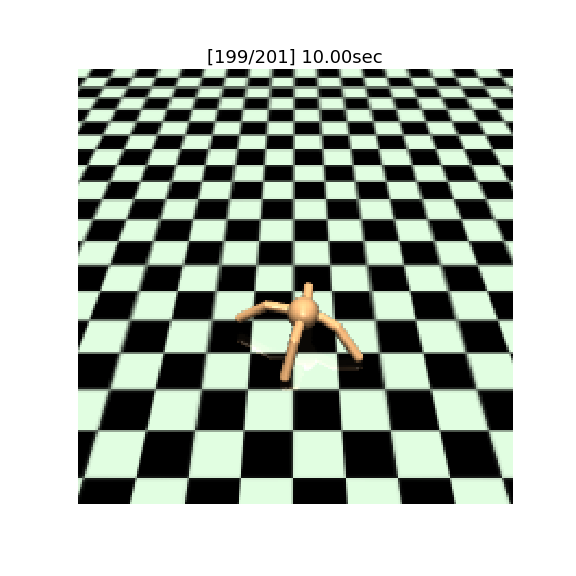
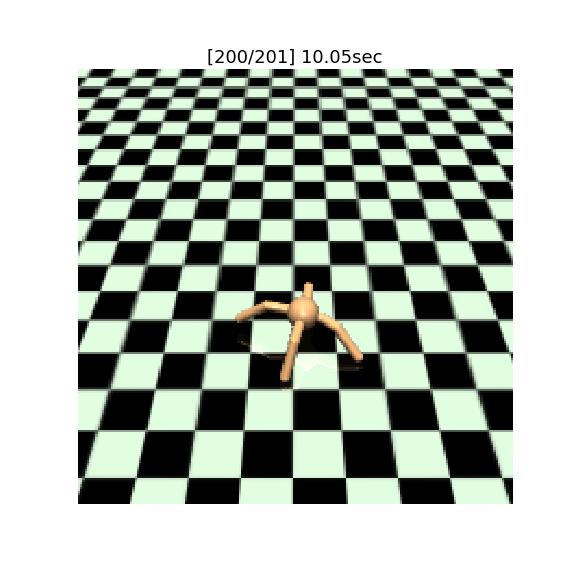

Done.


In [2]:
# Init env
env = AntEnvCustom()
env.reset() 
obs_dim,act_dim,dT = \ 
    env.observation_space.shape[0],env.action_space.shape[0],env.dt
print ("Environment initialized. obs_dim:[%d] act_dim:[%d] dt:[%.3fsec]"
    %(obs_dim,act_dim,env.dt))
obs,reward,done,_ = env.step(np.zeros(act_dim))
sec = env.sim.data.time # Get current time

# Init PID controller 
PID = PID_class(Kp=0.01,Ki=0.00001,Kd=0.001,windup=10000,sample_time=dT,dim=8)
print ("PID ready")

# Run
secTrigger,maxSec = 0,10
frames,titleStrs = [],[]
while sec < maxSec:
    # Render frame
    frame = env.render(mode='rgb_array',width=200,height=200)
    frames.append(frame) # Append to frames for futher animating 
    sec = env.sim.data.time
    titleStrs.append('%.2fsec'%(sec))

    # Set refPos every setTrigger 
    if sec >= secTrigger: 
        secTrigger = secTrigger + 1.0 # Change pose every second
        refPosDeg = env.minPosDeg + (env.maxPosDeg-env.minPosDeg)*np.random.rand(act_dim)
        PID.clear() # Clear PID when new target is set. 
    
    # Current position (in Deg)
    cPosDeg = np.asarray(obs[5:13])*180.0/np.pi

    # PID controller 
    degDiff = cPosDeg-refPosDeg
    PID.update(degDiff,sec)
    action = PID.output
    
    # Step 
    actionRsh = action[[6,7,0,1,2,3,4,5]] # rearrange
    obs, reward, done, rwdDetal = env.step(actionRsh.astype(np.float16))
    
    # Print out
    DO_PRINT = False
    if DO_PRINT:
        print ('sec: [%.2f] done: %s'%(sec,done))
        print (' cPosDeg:   %s'%(np.array2string(cPosDeg,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))
        print (' refPosDeg: %s'%(np.array2string(refPosDeg,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))           
        print (' degDiff:   %s'%(np.array2string(degDiff,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))
        print (' action:    %s'%(np.array2string(action,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))
        print (' reward:    %.3f (fwd:%.3f ctrl:%.3f)'
            %(reward,rwdDetal['reward_forward'],rwdDetal['reward_ctrl']))
print ("Makeing GIF..")
display_frames_as_gif(frames,_intv_ms=20,_figsize=(8,8),_fontsize=18,_titleStrs=titleStrs)
print ("Done.")